In [1]:
import os
import glob
import json
import cv2
import numpy as np
import torch
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
from torch import nn
import torch.optim as optim
from tqdm import tqdm
import torch.nn.functional as F
from torchsummary import summary
import torchvision.transforms.functional as TF
from torch.utils.data import DataLoader, TensorDataset

In [2]:
image_path = "Aerial_ss/dataset/semantic_drone_dataset/original_images"
mask_path = "Aerial_ss/RGB_color_image_masks/RGB_color_image_masks"
test_path = "Aerial_ss/test/images"
test_mask_path = "Aerial_ss/test/rgb_labels"

target_shape = (256, 256)

<>:1: SyntaxWarning: invalid escape sequence '\d'
<>:1: SyntaxWarning: invalid escape sequence '\d'
C:\Users\pc\AppData\Local\Temp\ipykernel_21724\274073718.py:1: SyntaxWarning: invalid escape sequence '\d'
  img = cv2.imread("Aerial_ss\dataset\semantic_drone_dataset\original_images\\006.jpg")


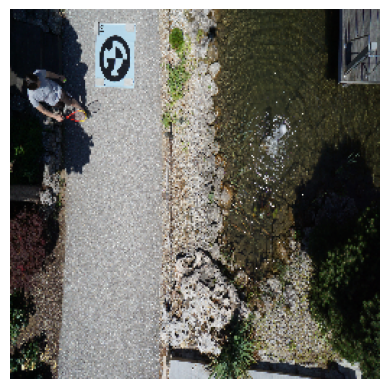

In [3]:
img = cv2.imread("Aerial_ss\dataset\semantic_drone_dataset\original_images\\006.jpg")
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img = cv2.resize(img, target_shape)
img = img / 255.0

plt.axis('off')
plt.imshow(img)

In [4]:
def load_data():

    image_files = glob.glob(os.path.join(image_path, "*.jpg"))

    X_train = np.array([ cv2.resize( cv2.cvtColor( cv2.imread(img_path), cv2.COLOR_RGB2BGR ), target_shape ) / 255.0 for img_path in image_files])

    mask_files = glob.glob(os.path.join(mask_path, "*.png"))

    y_train = np.array([ cv2.resize( cv2.cvtColor( cv2.imread(m_path), cv2.COLOR_RGB2BGR ), target_shape ) / 255.0 for m_path in mask_files])

    return X_train, y_train


def load_test():

    image_files = glob.glob(os.path.join(test_path, "*.jpg"))

    X_train = np.array([ cv2.resize( cv2.cvtColor( cv2.imread(img_path), cv2.COLOR_RGB2BGR ), target_shape ) / 255.0 for img_path in image_files])

    mask_files = glob.glob(os.path.join(test_mask_path, "*.png"))

    y_train = np.array([ cv2.resize( cv2.cvtColor( cv2.imread(m_path), cv2.COLOR_RGB2BGR ), target_shape ) / 255.0 for m_path in mask_files])

    return X_train, y_train


X_train, y_train = load_data()
X_train.shape, y_train.shape

((394, 256, 256, 3), (394, 256, 256, 3))

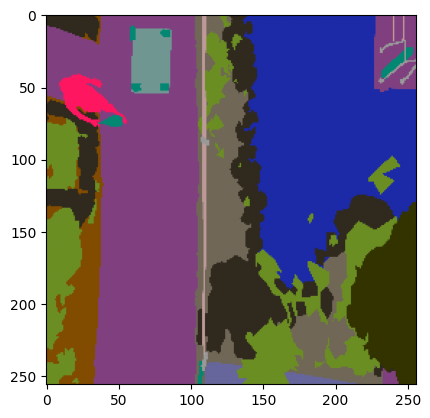

In [5]:
plt.imshow(X_train[0])
plt.imshow(y_train[0])
plt.show()

In [60]:


def crop_and_concat(encoder_layer, decoder_layer):
    """
    Crops the encoder_layer to match the size of the decoder_layer
    and then concatenates them.
    """
    _, _, H, W = decoder_layer.size()
    encoder_layer = TF.center_crop(encoder_layer, output_size=(H, W))  # Use TF.center_crop
    return torch.cat([encoder_layer, decoder_layer], dim=1)



class UNet(nn.Module):
    def __init__(self, in_channel=3, out_channel=3):
        super(UNet, self).__init__()

        # Encoder
        self.conv1 = nn.Conv2d(in_channels=in_channel, out_channels=64, kernel_size=3, padding=1)
        self.bn1 = nn.BatchNorm2d(64)
        self.conv2 = nn.Conv2d(in_channels=64, out_channels=64, kernel_size=3, padding=1)
        self.bn2 = nn.BatchNorm2d(64)

        self.maxpool = nn.MaxPool2d(kernel_size=2, stride=2)

        self.conv3 = nn.Conv2d(in_channels=64, out_channels=128, kernel_size=3, padding=1)
        self.bn3 = nn.BatchNorm2d(128)
        self.conv4 = nn.Conv2d(in_channels=128, out_channels=128, kernel_size=3, padding=1)
        self.bn4 = nn.BatchNorm2d(128)

        self.maxpool = nn.MaxPool2d(kernel_size=2, stride=2)

        self.conv5 = nn.Conv2d(in_channels=128, out_channels=256, kernel_size=3, padding=1)
        self.bn5 = nn.BatchNorm2d(256)
        self.conv6 = nn.Conv2d(in_channels=256, out_channels=256, kernel_size=3, padding=1)
        self.bn6 = nn.BatchNorm2d(256)

        self.maxpool = nn.MaxPool2d(kernel_size=2, stride=2)

        self.conv7 = nn.Conv2d(in_channels=256, out_channels=512, kernel_size=3, padding=1)
        self.bn7 = nn.BatchNorm2d(512)
        self.conv8 = nn.Conv2d(in_channels=512, out_channels=512, kernel_size=3, padding=1)
        self.bn8 = nn.BatchNorm2d(512)

        self.maxpool = nn.MaxPool2d(kernel_size=2, stride=2)

        # BottleNeck
        self.conv9 = nn.Conv2d(in_channels=512, out_channels=512, kernel_size=3, padding=1)
        self.bn9 = nn.BatchNorm2d(512)
        self.conv10 = nn.Conv2d(in_channels=512, out_channels=512, kernel_size=3, padding=1)
        self.bn10 = nn.BatchNorm2d(512)

            
        # Decoder
        self.conv11 = nn.ConvTranspose2d(in_channels=512, out_channels=512, kernel_size=2, stride=2, padding=0)
        self.bn11 = nn.BatchNorm2d(512)
        self.conv12 = nn.Conv2d(in_channels=1024, out_channels=512, kernel_size=3, stride=1, padding=1)
        self.bn12 = nn.BatchNorm2d(512)
        self.conv13 = nn.Conv2d(in_channels=512, out_channels=512, kernel_size=3, stride=1, padding=1)
        self.bn13 = nn.BatchNorm2d(512)

        self.conv14 = nn.ConvTranspose2d(in_channels=512, out_channels=256, kernel_size=2, stride=2, padding=0)
        self.bn14 = nn.BatchNorm2d(256)
        self.conv15 = nn.Conv2d(in_channels=512, out_channels=256, kernel_size=3, stride=1, padding=1)
        self.bn15 = nn.BatchNorm2d(256)
        self.conv16 = nn.Conv2d(in_channels=256, out_channels=256, kernel_size=3, stride=1, padding=1)
        self.bn16 = nn.BatchNorm2d(256)

        self.conv17 = nn.ConvTranspose2d(in_channels=256, out_channels=128, kernel_size=2, stride=2, padding=0)
        self.bn17 = nn.BatchNorm2d(128)
        self.conv18 = nn.Conv2d(in_channels=256, out_channels=198, kernel_size=3, stride=1, padding=1)
        self.bn18 = nn.BatchNorm2d(198)
        self.conv19 = nn.Conv2d(in_channels=198, out_channels=198, kernel_size=3, stride=1, padding=1)
        self.bn19 = nn.BatchNorm2d(198)

        self.conv20 = nn.ConvTranspose2d(in_channels=198, out_channels=64, kernel_size=2, stride=2, padding=0)
        self.bn20 = nn.BatchNorm2d(64)
        self.conv21 = nn.Conv2d(in_channels=128, out_channels=64, kernel_size=3, stride=1, padding=1)
        self.bn21 = nn.BatchNorm2d(64)
        self.conv22 = nn.Conv2d(in_channels=64, out_channels=64, kernel_size=3, stride=1, padding=1)
        self.bn22 = nn.BatchNorm2d(64)

        # Output layer  
        # self.conv23 = nn.Conv2d(in_channels=64, out_channels=64, kernel_size=5, stride=1, padding=2)
        # self.bn23 = nn.BatchNorm2d(64)
        # self.conv24 = nn.Conv2d(in_channels=64, out_channels=64, kernel_size=5, stride=1, padding=2)
        # self.bn24 = nn.BatchNorm2d(64)
        # self.conv25 = nn.Conv2d(in_channels=64, out_channels=64, kernel_size=7, stride=1, padding=3)
        # self.bn25 = nn.BatchNorm2d(64)
        # self.conv26 = nn.Conv2d(in_channels=64, out_channels=64, kernel_size=7, stride=1, padding=3)
        # self.bn26 = nn.BatchNorm2d(64)
        # self.conv27 = nn.Conv2d(in_channels=64, out_channels=64, kernel_size=7, stride=1, padding=3)
        # self.bn27 = nn.BatchNorm2d(64)
        
        self.output = nn.Conv2d(in_channels=64, out_channels=out_channel, kernel_size=1, stride=1, padding=0)
        # self.sigmoid = nn.Sigmoid()
        self.softmax = nn.Softmax(dim=1)

        # Dropout
        self.dropout = nn.Dropout(0.2)



        
    def forward(self, x):

        # Encoder
        x = self.conv1(x)
        x = self.bn1(x)
        x = F.relu(x)
        y_4 = self.conv2(x)
        x = self.bn2(x)
        y_4 = F.relu(y_4)

        x = self.maxpool(y_4)

        x = self.conv3(x)
        x = self.bn3(x)
        x = F.relu(x)
        y_3 = self.conv4(x)
        x = self.bn4(x)
        y_3 = F.relu(y_3)

        x = self.maxpool(y_3)

        x = self.dropout(x)
        
        x = self.conv5(x)
        x = self.bn5(x)
        x = F.relu(x)
        y_2 = self.conv6(x)
        x = self.bn6(x)
        y_2 = F.relu(y_2)

        x = self.maxpool(y_2)
        
        x = self.conv7(x)
        x = self.bn7(x)
        x = F.relu(x)
        y_1 = self.conv8(x)
        x = self.bn8(x)
        y_1 = F.relu(y_1)

        x = self.maxpool(y_1)

        x = self.dropout(x)

        # Bottleneck
        x = self.conv9(x)
        x = self.bn9(x)
        x = F.relu(x)
        x = self.conv10(x)
        x = self.bn10(x)
        x = F.relu(x)


        # # # Decoder

        x = self.conv11(x)
        x = self.bn11(x)
        x = F.relu(x)
        x = crop_and_concat(y_1, x)
        x = self.conv12(x)
        x = self.bn12(x)
        x = F.relu(x)
        x = self.conv13(x)
        x = self.bn13(x)
        x = F.relu(x)

        x = self.conv14(x)
        x = self.bn14(x)
        x = F.relu(x)
        x = crop_and_concat(y_2, x)
        x = self.conv15(x)
        x = self.bn15(x)
        x = F.relu(x)
        x = self.conv16(x)
        x = self.bn16(x)
        x = F.relu(x)

        x = self.dropout(x)

        x = self.conv17(x)
        x = self.bn17(x)
        x = F.relu(x)
        x = crop_and_concat(y_3, x)
        x = self.conv18(x)
        x = self.bn18(x)
        x = F.relu(x)
        x = self.conv19(x)
        x = self.bn19(x)
        x = F.relu(x)

        x = self.conv20(x)
        x = self.bn20(x)
        x = F.relu(x)
        x = crop_and_concat(y_4, x)
        x = self.conv21(x)
        x = self.bn21(x)
        x = F.relu(x)
        x = self.conv22(x)
        x = self.bn22(x)
        x = F.relu(x)


        # Output layer
        # x = self.conv23(x)
        # x = self.bn23(x)
        # x = F.relu(x)

        # x = self.conv24(x)
        # x = self.bn24(x)
        # x = F.relu(x)

        # x = self.conv25(x)
        # x = self.bn25(x)
        # x = F.relu(x)

        # x = self.conv26(x)
        # x = self.bn26(x)
        # x = F.relu(x)

        # x = self.conv27(x)
        # x = self.bn27(x)
        # x = F.relu(x)

        x = self.output(x)
        # x = self.sigmoid(x)
        x = self.softmax(x)


        return x
    



# Display the model summary
summary(UNet(1).cuda(), (1, target_shape[0], target_shape[1]))


----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 256, 256]             640
       BatchNorm2d-2         [-1, 64, 256, 256]             128
            Conv2d-3         [-1, 64, 256, 256]          36,928
       BatchNorm2d-4         [-1, 64, 256, 256]             128
         MaxPool2d-5         [-1, 64, 128, 128]               0
            Conv2d-6        [-1, 128, 128, 128]          73,856
       BatchNorm2d-7        [-1, 128, 128, 128]             256
            Conv2d-8        [-1, 128, 128, 128]         147,584
       BatchNorm2d-9        [-1, 128, 128, 128]             256
        MaxPool2d-10          [-1, 128, 64, 64]               0
          Dropout-11          [-1, 128, 64, 64]               0
           Conv2d-12          [-1, 256, 64, 64]         295,168
      BatchNorm2d-13          [-1, 256, 64, 64]             512
           Conv2d-14          [-1, 256,

In [21]:

class DiceLoss(nn.Module):
    def __init__(self, smooth=1.0):
        super(DiceLoss, self).__init__()
        self.smooth = smooth

    def forward(self, outputs, targets):
        # Flatten the tensors to simplify the calculation
        outputs = outputs.contiguous().view(outputs.size(0), -1)
        targets = targets.contiguous().view(targets.size(0), -1)
        
        # Calculate the intersection and union
        intersection = (outputs * targets).sum(dim=1)
        union = outputs.sum(dim=1) + targets.sum(dim=1)
        
        # Calculate Dice coefficient
        dice = (2. * intersection + self.smooth) / (union + self.smooth)
        
        # Dice Loss
        loss = 1 - dice.mean()  # Mean over the batch
        
        return loss


In [ ]:
class DiceLoss(nn.Module):
    def __init__(self, smooth=1.0):
        super(DiceLoss, self).__init__()
        self.smooth = smooth

    def forward(self, outputs, targets):
        # Assuming outputs are after softmax and have shape [batch_size, num_classes, height, width]
        num_classes = outputs.size(1)
        
        # Flatten the tensors to simplify the calculation
        outputs = outputs.contiguous().view(outputs.size(0), num_classes, -1)
        targets = targets.contiguous().view(targets.size(0), num_classes, -1)
        
        # Calculate the intersection and union for each class
        intersection = (outputs * targets).sum(dim=2)
        union = outputs.sum(dim=2) + targets.sum(dim=2)
        
        # Calculate Dice coefficient for each class
        dice = (2. * intersection + self.smooth) / (union + self.smooth)
        
        # Dice Loss (mean over the classes)
        loss = 1 - dice.mean(dim=1).mean()  # Mean over the batch and classes
        
        return loss


In [ ]:


class DiceBCELoss(nn.Module):
    def __init__(self, smooth=1.0):
        super(DiceBCELoss, self).__init__()
        self.smooth = smooth
        self.bce = nn.BCELoss()  # Use BCELoss instead of BCEWithLogitsLoss

    def forward(self, outputs, targets):
        # Apply BCE Loss
        bce_loss = self.bce(outputs, targets)

        # Flatten the tensors to simplify the calculation
        outputs = outputs.contiguous().view(outputs.size(0), -1)
        targets = targets.contiguous().view(targets.size(0), -1)

        # Calculate the intersection and union
        intersection = (outputs * targets).sum(dim=1)
        union = outputs.sum(dim=1) + targets.sum(dim=1)

        # Calculate Dice coefficient
        dice = (2. * intersection + self.smooth) / (union + self.smooth)
        dice_loss = 1 - dice.mean()

        # Combine Dice Loss and BCE Loss
        loss = bce_loss + dice_loss

        return loss

In [61]:
model = UNet(3, 3).to('cuda')
# criterion = nn.BCELoss()
criterion = nn.CrossEntropyLoss()
# criterion = DiceLoss()
optimizer = optim.Adam(model.parameters(), lr=0.00005)

In [62]:
BATCH_SIZE = 8

# Convert the data to PyTorch tensors
X_train_tensor = torch.tensor(X_train, dtype=torch.float32).permute(0, 3, 1, 2)  # Shape: (72, 3, 256, 256)
y_train_tensor = torch.tensor(y_train, dtype=torch.float32).permute(0, 3, 1, 2)  # Shape: (72, 3, 256, 256)

# Custom Dataset class
class SegmentationDataset(Dataset):
    def __init__(self, images, masks):
        self.images = images
        self.masks = masks

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        image = self.images[idx]
        mask = self.masks[idx]
        return image, mask

# Create dataset and dataloader
train_dataset = SegmentationDataset(X_train_tensor, y_train_tensor)
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
train_loader.dataset.images.shape, train_loader.dataset.masks.shape

(torch.Size([394, 3, 256, 256]), torch.Size([394, 3, 256, 256]))

In [63]:

def display_images(train_loader, model, num_images=5):
    model.eval()  # Set model to evaluation mode
    
    # Load a batch of images and masks
    images, masks = next(iter(train_loader))
    images = images.cuda()
    masks = masks.cuda()

    # Generate predictions
    with torch.no_grad():
        outputs = model(images)
    
    # Convert tensors to numpy arrays and transpose for plotting
    images = images.cpu().numpy().transpose(0, 2, 3, 1)  # (N, C, H, W) -> (N, H, W, C)
    masks = masks.cpu().numpy().transpose(0, 2, 3, 1)    # (N, C, H, W) -> (N, H, W, C)
    outputs = outputs.cpu().numpy().transpose(0, 2, 3, 1)  # (N, C, H, W) -> (N, H, W, C)

    # Convert single-channel masks and outputs to three channels
    if masks.shape[-1] == 1:
        masks = np.concatenate([masks] * 3, axis=-1)  # Convert to 3-channel RGB
    if outputs.shape[-1] == 1:
        outputs = np.concatenate([outputs] * 3, axis=-1)  # Convert to 3-channel RGB

    # Plotting
    fig, axes = plt.subplots(num_images, 3, figsize=(15, num_images * 5))

    for i in range(num_images):
        # Original Image
        axes[i, 0].imshow(images[i])
        axes[i, 0].set_title('Original Image')
        axes[i, 0].axis('off')

        # Ground Truth Mask
        axes[i, 1].imshow(masks[i])
        axes[i, 1].set_title('Ground Truth Mask')
        axes[i, 1].axis('off')

        # Generated Mask
        axes[i, 2].imshow(outputs[i])
        axes[i, 2].set_title('Generated Mask')
        axes[i, 2].axis('off')

    plt.tight_layout()
    plt.show()


In [36]:
optimizer = optim.Adam(model.parameters(), lr=0.000005)

In [37]:
# model.load_state_dict(torch.load("checkpoints/Unet_epoch_150.pth"))

Epoch [152/200], Loss: 0.5511
Epoch [153/200], Loss: 0.5501
Epoch [154/200], Loss: 0.5477
Epoch [155/200], Loss: 0.5525
Epoch [156/200], Loss: 0.5511
Epoch [157/200], Loss: 0.5488
Epoch [158/200], Loss: 0.5491
Epoch [159/200], Loss: 0.5524
Epoch [160/200], Loss: 0.5457
Epoch [161/200], Loss: 0.5527
Epoch [162/200], Loss: 0.5518
Epoch [163/200], Loss: 0.5486
Epoch [164/200], Loss: 0.5501
Epoch [165/200], Loss: 0.5498
Epoch [166/200], Loss: 0.5486
Epoch [167/200], Loss: 0.5469
Epoch [168/200], Loss: 0.5495
Epoch [169/200], Loss: 0.5465
Epoch [170/200], Loss: 0.5482
Epoch [171/200], Loss: 0.5461
Epoch [172/200], Loss: 0.5471
Epoch [173/200], Loss: 0.5471
Epoch [174/200], Loss: 0.5472
Epoch [175/200], Loss: 0.5480
Epoch [176/200], Loss: 0.5471
Epoch [177/200], Loss: 0.5502
Epoch [178/200], Loss: 0.5498
Epoch [179/200], Loss: 0.5508
Epoch [180/200], Loss: 0.5463
Epoch [181/200], Loss: 0.5482
Epoch [182/200], Loss: 0.5470
Epoch [183/200], Loss: 0.5441
Epoch [184/200], Loss: 0.5477
Epoch [185

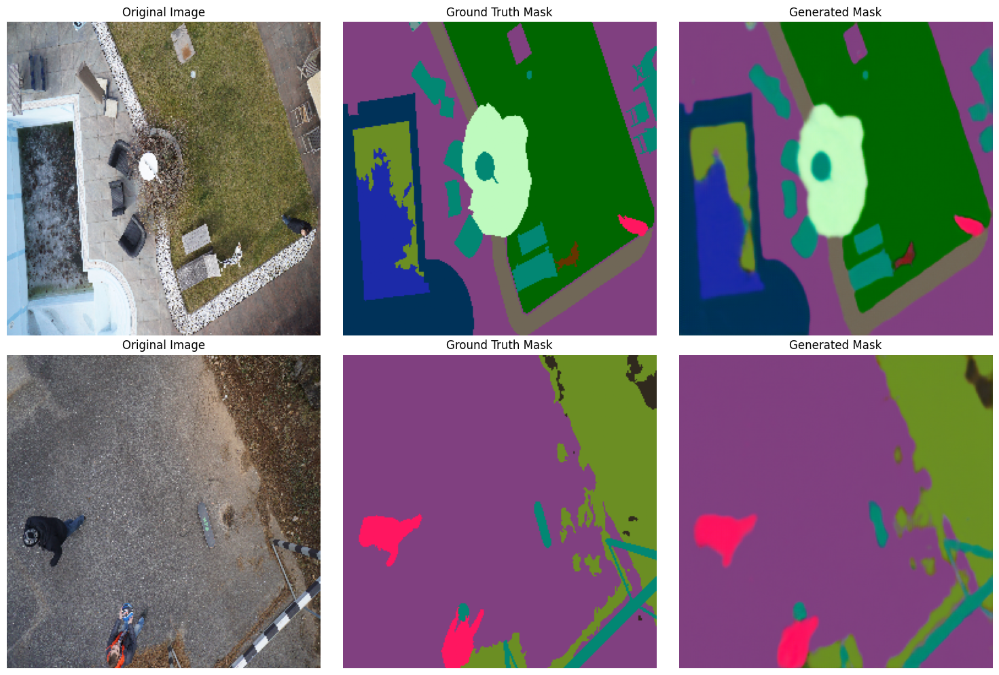

Epoch [202/200], Loss: 0.5447
Epoch [203/200], Loss: 0.5474
Epoch [204/200], Loss: 0.5459
Epoch [205/200], Loss: 0.5469
Epoch [206/200], Loss: 0.5476


In [12]:
# Training the model
num_epochs = 200
lambda_l1 = 1.0 # Pix2Pix used 100.0

for epoch in range(151, num_epochs+151):
    model.train()
    running_loss = 0.0
    
    for i, (images, masks) in enumerate(train_loader):
        images = images.cuda()
        masks = masks.cuda()

        # Zero the parameter gradients
        optimizer.zero_grad()

        # Forward pass
        outputs = model(images)
        loss = criterion(outputs, masks)

        # L1 loss
        l1_loss = nn.L1Loss()(outputs, masks) * lambda_l1
        loss += l1_loss

        # Backward pass and optimize
        loss.backward()
        optimizer.step()

        running_loss += loss.item()


    print(f'Epoch [{epoch + 1}/{num_epochs}], Loss: {running_loss / len(train_loader):.4f}')
    
    if (epoch) % 50 == 0:
        torch.save(model.state_dict(), f'checkpoints/Unet_epoch_{epoch}.pth')
        display_images(train_loader, model, 2)

print('Training completed.')

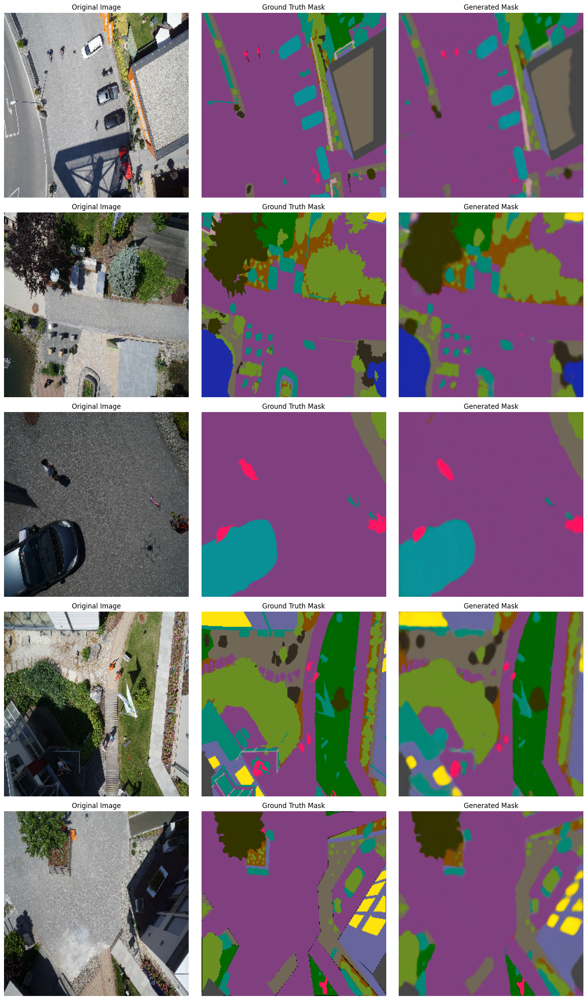

In [60]:
display_images(train_loader, model, 5)

In [57]:
X_test, y_test = load_test()

# Convert the data to PyTorch tensors
X_test_tensor = torch.tensor(X_test, dtype=torch.float32).permute(0, 3, 1, 2)  # Shape: (72, 3, 256, 256)
y_test_tensor = torch.tensor(y_test, dtype=torch.float32).permute(0, 3, 1, 2)  # Shape: (72, 3, 256, 256)

# Custom Dataset class
class SegmentationDataset(Dataset):
    def __init__(self, images, masks):
        self.images = images
        self.masks = masks

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        image = self.images[idx]
        mask = self.masks[idx]
        return image, mask

# Create dataset and dataloader
test_dataset = SegmentationDataset(X_test_tensor, y_test_tensor)
test_loader = DataLoader(test_dataset, batch_size=6, shuffle=True)
test_loader.dataset.images.shape, test_loader.dataset.masks.shape

(torch.Size([6, 3, 256, 256]), torch.Size([6, 3, 256, 256]))

In [58]:
images, masks = next(iter(train_loader))
print(images.shape)  # Should be (batch_size, channels, height, width)
print(masks.shape)   # Should be (batch_size, channels, height, width)


torch.Size([8, 3, 256, 256])
torch.Size([8, 3, 256, 256])


In [92]:
print(f'Total number of images in test_loader: {len(test_loader.dataset)}')


Total number of images in test_loader: 6


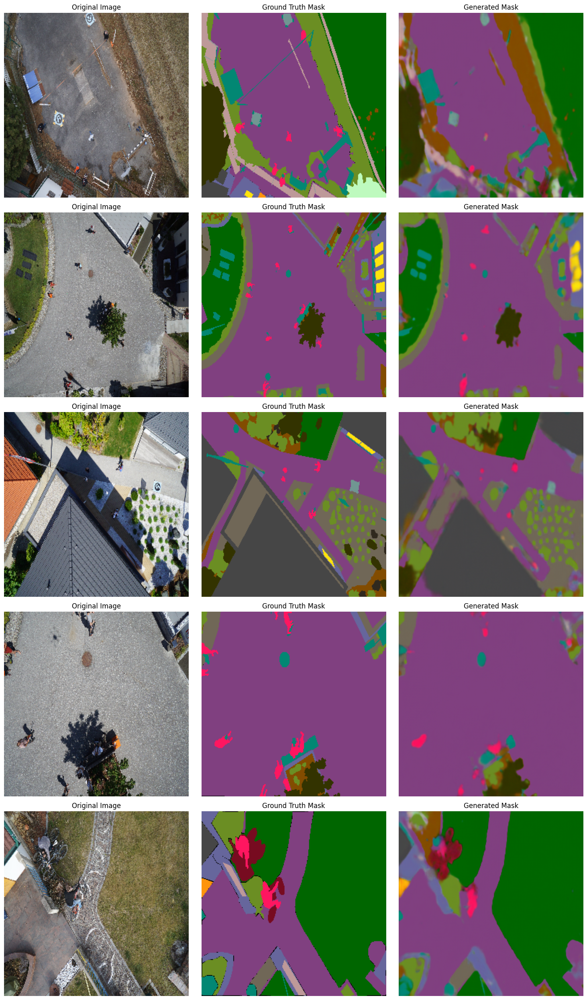

In [93]:
display_images(test_loader, model)